通过09的测试,我们发现加入了金价后,金价的标准化响应斜率是负值.这在经济上完全说不通,黄金是紫金矿业的主要盈利方式之一,应该呈现正相关性.  
我们加入了金铜今日涨幅,假如说股票长期横盘,那么只要系数不为0,那么就会对预测价格起到或正或负的效果.这不应该成立.首先,再次测试20年的数据,删去金铜涨幅,看看是否会出现下跌现象.模型可能把涨的慢理解成了股价应该降低的信号.

---

# 基准模型与金铜涨幅模型：2020年对比

按此前实验口径，“2019年前”采用**截至2019年12月31日（含2019年）**的历史数据训练，2020年全部记录测试。比较：

- Base_100：原7个水平变量，不含金铜涨幅，100轮。
- Base_400：相同基准模型，沿同一训练路径继续至400轮。
- Full_100：原7变量＋金铜5/20条记录累计涨幅，100轮。

三组统一为ReLU、16/32隐藏层、线性输出、Adam学习率0.01、全批量、seed42，输入和目标仅用训练集拟合StandardScaler。三组使用相同日期，统一去掉计算20期涨幅所需的前20条记录。因输入维度不同，两类模型不能视为完全相同的初始化权重；本次是单随机种子的探索性对比。

沿用原Dataset.pkl的**同日目标股价**，并非下一日收益率预测。涨幅按相邻数据记录计算，不保证是A股交易日；这里不重新修改原数据对齐口径。本次不根据2020结果选择训练轮数。


In [1]:
from pathlib import Path
import os, json, hashlib
import numpy as np
import pandas as pd
import torch
from torch import nn
from sklearn.preprocessing import StandardScaler
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import plotly.express as px
from IPython.display import display, Image
ROOT=next((p for p in [Path.cwd(),*Path.cwd().parents] if (p/'src/pickle/Dataset.pkl').exists()),Path('/Users/admin/数据分析/ZiJin-Mining/ZiJin-Mining-stock-prediction-'))
OUT=Path(os.environ.get('MLP10_OUT',str(ROOT/'results/mlp_base_vs_returns_10')))
OUT.mkdir(parents=True,exist_ok=True)
SEED=42; LR=0.01
torch.set_num_threads(1)
dataset=ROOT/'src/pickle/Dataset.pkl'
d=pd.read_pickle(dataset); raw=d['X'].copy(); target=d['Y'].copy()
assert raw.index.equals(target.index) and raw.shape[1]==7
assert raw.index.is_unique and raw.index.is_monotonic_increasing
BASE=list(raw.columns); x=raw.copy()
for metal,col in [('gold','Gold Futures Price'),('copper','Copper Futures Price')]:
    for k in [5,20]: x[f'{metal}_{k}']=raw[col]/raw[col].shift(k)-1
x=x.dropna(); FULL=list(x.columns)
y=pd.Series(np.asarray(target).reshape(-1),index=raw.index,name='Actual').loc[x.index]
tr=x.index[x.index.year<2020]; te=x.index[x.index.year==2020]
assert len(tr)>0 and len(te)>0 and tr.max()<te.min()
assert np.isfinite(x.to_numpy()).all() and np.isfinite(y).all() and (y>0).all()
splits=pd.DataFrame([{'Split':s,'N':len(idx),'Start':str(idx.min().date()),'End':str(idx.max().date())} for s,idx in [('Train',tr),('Test',te)]])
splits.to_csv(OUT/'splits.csv',index=False)
config={'seed':SEED,'lr':LR,'hidden':[16,32],'activation':'ReLU','batch':'full','target':'original same-date price','base_features':BASE,'full_features':FULL,'train_end':str(tr.max()),'test_year':2020,'common_samples':True,'dataset_sha256':hashlib.sha256(dataset.read_bytes()).hexdigest(),'torch_version':str(torch.__version__)}
(OUT/'config.json').write_text(json.dumps(config,ensure_ascii=False,indent=2))
display(splits); display(pd.DataFrame({'Base features':BASE}))


,Split,N,Start,End
0,Train,2034,2012-06-06,2019-12-31
1,Test,271,2020-01-01,2020-12-31


,Base features
0,A_500
1,Dollar Index
2,cn_10y_rate
3,us_10y_rate
4,brent
5,Copper Futures Price
6,Gold Futures Price


In [2]:
sy=StandardScaler().fit(y.loc[tr].to_numpy().reshape(-1,1))
yt=torch.tensor(sy.transform(y.loc[tr].to_numpy().reshape(-1,1)),dtype=torch.float32)
metric_rows=[]; frames=[]; histories=[]
for family,cols,checkpoints in [('Base',BASE,[100,400]),('Full',FULL,[100])]:
    sx=StandardScaler().fit(x.loc[tr,cols])
    xt=torch.tensor(sx.transform(x.loc[tr,cols]),dtype=torch.float32)
    torch.manual_seed(SEED)
    model=nn.Sequential(nn.Linear(len(cols),16),nn.ReLU(),nn.Linear(16,32),nn.ReLU(),nn.Linear(32,1))
    optimizer=torch.optim.Adam(model.parameters(),lr=LR)
    for epoch in range(1,max(checkpoints)+1):
        model.train(); optimizer.zero_grad()
        loss=((model(xt)-yt)**2).mean(); assert torch.isfinite(loss)
        loss.backward(); optimizer.step(); model.eval()
        with torch.no_grad(): mse=((model(xt)-yt)**2).mean().item()
        histories.append({'Family':family,'Epoch':epoch,'Train_MSE_standardized':mse})
        if epoch not in checkpoints: continue
        name=f'{family}_{epoch}'
        torch.save({'state_dict':model.state_dict(),'features':cols,'epoch':epoch,'seed':SEED,
                    'train_start':str(tr.min()),'train_end':str(tr.max()),
                    'sx_mean':sx.mean_.tolist(),'sx_scale':sx.scale_.tolist(),
                    'sy_mean':sy.mean_.tolist(),'sy_scale':sy.scale_.tolist()},OUT/f'{name}.pt')
        for split,idx in [('Train',tr),('Test',te)]:
            with torch.no_grad():
                z=model(torch.tensor(sx.transform(x.loc[idx,cols]),dtype=torch.float32)).numpy()
            pred=sy.inverse_transform(z).ravel(); actual=y.loc[idx].to_numpy()
            assert np.isfinite(pred).all()
            err=pred-actual
            frames.append(pd.DataFrame({'Date':idx,'Model':name,'Split':split,'Actual':actual,'Predicted':pred,'APE':100*np.abs(err)/actual,'PE':100*err/actual}))
            metric_rows.append({'Model':name,'Split':split,'N':len(idx),'MAPE':100*np.mean(np.abs(err)/actual),'MAE':np.abs(err).mean(),'RMSE':np.sqrt(np.mean(err**2)),'MPE':100*np.mean(err/actual)})
metrics=pd.DataFrame(metric_rows); predictions=pd.concat(frames,ignore_index=True); history=pd.DataFrame(histories)
metrics.to_csv(OUT/'metrics.csv',index=False); predictions.to_csv(OUT/'predictions.csv',index=False); history.to_csv(OUT/'training_history.csv',index=False)
order=['Base_100','Base_400','Full_100']
comparison=metrics.pivot(index='Model',columns='Split',values='MAPE').loc[order]
comparison.columns=[f'{c}_MAPE_percent' for c in comparison.columns]
display(comparison.round(4)); display(metrics[metrics.Split=='Test'].set_index('Model').loc[order].round(4))
# 同数据、同模型的Full_100应复现08中的已存结果；该检查不用于训练。
old_path=ROOT/'results/mlp_epochs100_400_annual_08/predictions.csv'
old_config=ROOT/'results/mlp_epochs100_400_annual_08/config.json'
if old_path.exists() and old_config.exists():
    assert json.loads(old_config.read_text())['dataset_sha256']==config['dataset_sha256']
    old=pd.read_csv(old_path,parse_dates=['Date'])
    old=old[(old.Year==2020)&(old.Split=='Test')&(old.Epoch==100)].sort_values('Date')
    current=predictions[(predictions.Split=='Test')&(predictions.Model=='Full_100')].sort_values('Date')
    assert pd.DatetimeIndex(old.Date).equals(pd.DatetimeIndex(current.Date))
    assert np.allclose(old.Actual,current.Actual)
    delta=float(np.max(np.abs(old.Predicted.to_numpy()-current.Predicted.to_numpy())))
    assert delta<1e-4, f'与原100轮结果不一致: {delta}'
    print(f'已复核：Full_100复现08结果，预测最大绝对差={delta:.8g}')


,Test_MAPE_percent,Train_MAPE_percent
Model,,
Base_100,13.2110,2.7855
Base_400,13.8715,2.0287
Full_100,15.6667,2.9579


,Split,N,MAPE,MAE,RMSE,MPE
Model,,,,,,
Base_100,Test,271,13.2110,0.7913,1.0089,-2.9254
Base_400,Test,271,13.8715,0.7529,0.9091,3.3432
Full_100,Test,271,15.6667,1.0631,1.5448,-11.3042


已复核：Full_100复现08结果，预测最大绝对差=2.3751831e-07


## 2020年预测曲线、误差与训练收敛

黑线为原目标股价。MAPE为平均绝对百分比误差，越小越好；MPE保留符号，负值表示平均低估。下面同时保留静态图和可缩放、悬停的交互图。

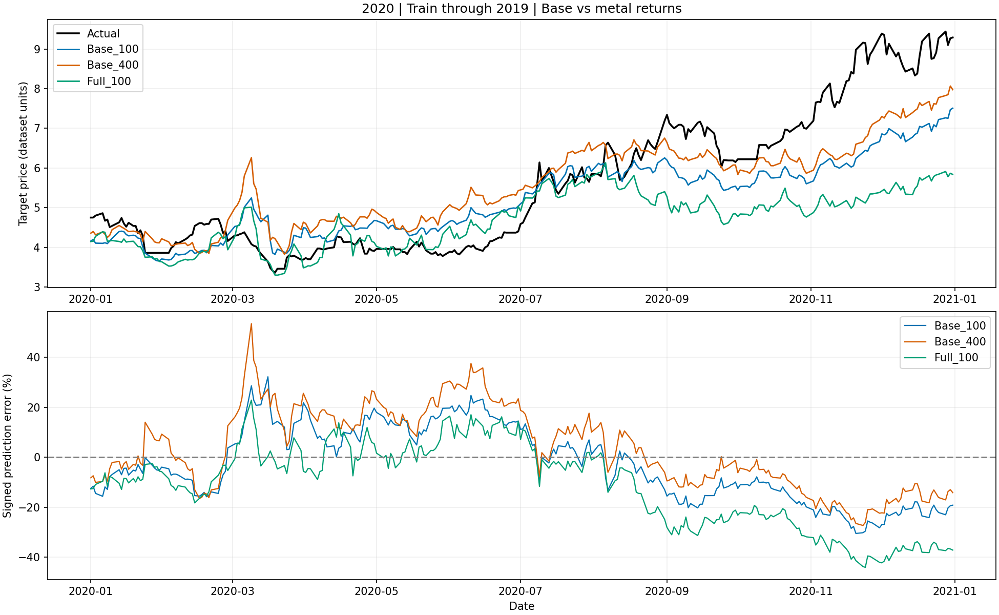

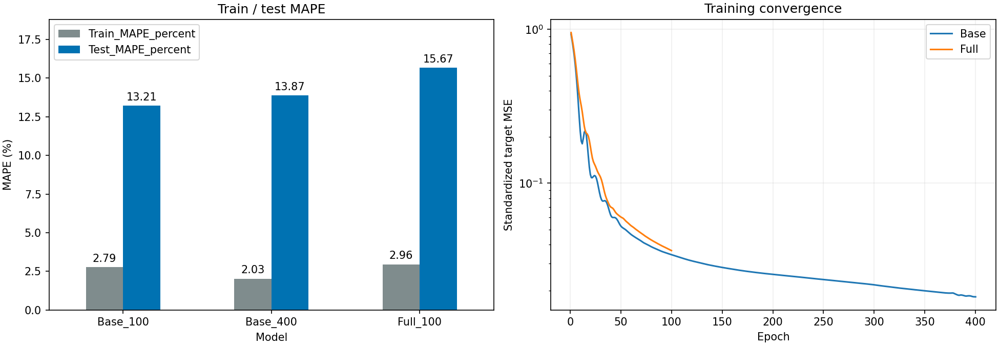

Model,Base_100,Base_400,Full_100
Month,,,
2020-01,7.026,5.827,8.305
2020-02,10.190,7.940,11.377
2020-03,14.663,23.317,5.994
2020-04,10.438,17.350,6.599
2020-05,13.649,18.135,3.434
2020-06,17.757,26.940,11.846
2020-07,4.631,9.763,3.965
2020-08,5.949,5.671,11.790
2020-09,15.084,7.547,26.604


In [3]:
test=predictions[predictions.Split=='Test'].copy()
colors={'Base_100':'#0072B2','Base_400':'#D55E00','Full_100':'#009E73'}
fig,axes=plt.subplots(2,1,figsize=(13,8),constrained_layout=True)
axes[0].plot(te,y.loc[te],color='black',lw=1.7,label='Actual')
for name in order:
    g=test[test.Model==name]
    axes[0].plot(g.Date,g.Predicted,color=colors[name],lw=1.3,label=name)
    axes[1].plot(g.Date,g.PE,color=colors[name],lw=1.1,label=name)
axes[0].set(title='2020 | Train through 2019 | Base vs metal returns',ylabel='Target price (dataset units)')
axes[1].set(ylabel='Signed prediction error (%)',xlabel='Date'); axes[1].axhline(0,color='gray',ls='--')
for ax in axes: ax.legend(); ax.grid(alpha=.2)
fig.savefig(OUT/'test_comparison.png',dpi=150); plt.close(fig); display(Image(filename=str(OUT/'test_comparison.png')))
fig,axes=plt.subplots(1,2,figsize=(13,4.5),constrained_layout=True)
comparison[['Train_MAPE_percent','Test_MAPE_percent']].plot.bar(ax=axes[0],rot=0,color=['#7f8c8d','#0072B2'])
axes[0].set(title='Train / test MAPE',ylabel='MAPE (%)',xlabel='Model'); axes[0].margins(y=.2)
for c in axes[0].containers: axes[0].bar_label(c,fmt='%.2f',padding=3)
for family,g in history.groupby('Family'): axes[1].plot(g.Epoch,g.Train_MSE_standardized,label=family)
axes[1].set(title='Training convergence',xlabel='Epoch',ylabel='Standardized target MSE',yscale='log'); axes[1].legend(); axes[1].grid(alpha=.2)
fig.savefig(OUT/'metrics_convergence.png',dpi=150); plt.close(fig); display(Image(filename=str(OUT/'metrics_convergence.png')))
actual=pd.DataFrame({'Date':te,'Model':'Actual','Price':y.loc[te].to_numpy()})
lines=pd.concat([actual,test[['Date','Model','Predicted']].rename(columns={'Predicted':'Price'})],ignore_index=True)
fig=px.line(lines,x='Date',y='Price',color='Model',render_mode='svg',color_discrete_map={'Actual':'black',**colors},title='2020: Actual / Base 100 / Base 400 / Full 100',height=570)
fig.update_layout(hovermode='x unified',xaxis_rangeslider_visible=True)
fig.write_html(OUT/'test_comparison.html',include_plotlyjs=True)
display(fig)
monthly=test.assign(Month=test.Date.dt.strftime('%Y-%m')).groupby(['Month','Model']).APE.mean().unstack()[order]
monthly.to_csv(OUT/'monthly_mape.csv');display(monthly.round(3))


## 如何解释本次对比

Base_100与Base_400比较的是同一训练路径上的训练时长。Base_100与Full_100比较的是有无金铜5/20期涨幅的特征方案。只凭一次年度、单种子的误差不能证明涨幅变量必然有用或无用，也不能推导经济因果。

开头保留的实验设想属于待检验假设：单个金价变量的条件响应为负，不等于黄金实际经济作用为负；横盘时涨幅变量为零不代表模型整体预测必须不变。此次先检验删除涨幅后预测曲线和误差如何变化。

## 本次运行结果

训练区间：2012-06-06至2019-12-31，共2034条；测试区间：2020-01-01至2020-12-31，共271条（沿用原数据记录）。

|模型|训练MAPE|2020测试MAPE|测试MAE|测试RMSE|测试MPE|
|---|---:|---:|---:|---:|---:|
|基准100轮|2.7855%|13.2110%|0.7914|1.0089|-2.9254%|
|基准400轮|2.0287%|13.8715%|0.7529|0.9091|+3.3432%|
|含金铜涨幅100轮|2.9579%|15.6667%|1.0631|1.5448|-11.3042%|

- 同为100轮，删除涨幅后测试MAPE降低2.4557个百分点。2020年8—12月每个月的误差都低于含涨幅100轮，下半年低估明显减轻，但9—10月预测仍有回落，11—12月仍明显低估，不能说问题已完全解决。
- 基准从100轮延长到400轮，训练MAPE下降，但全年测试MAPE增加0.6605个百分点。400轮在下半年更贴近实际，上半年3—6月高估更明显。
- 400轮的MAE、RMSE却低于基准100轮：不同指标排名不完全一致，不能笼统说400轮全面更差。MAPE衡量相对误差，对相同绝对误差，低股价时期的权重更高。
- 含涨幅100轮在3—7月的月度MAPE更低。这说明涨幅方案的表现具有阶段差异，不能从全年单一排名推导涨幅信息普遍无效。
- Full_100与08中同数据同设置的预测最大绝对差约2.38e-7，已确认可复现。三组仍是同日股价拟合的跨年测试，不代表可直接交易的次日预测能力。


基准模型相对于加入了涨跌幅的模型,训练轮数的加大并不会显著影响误差,而含金铜涨跌幅的模型会急剧恶化,MAPE在200,300,400轮变成25%左右.

# 2015—2026逐年比较三个模型：跨年度稳定性

保留前面的2020实验。本节固定Base_100、Base_400、Full_100三个配置，每个测试年仅使用此前全部共同样本重新训练，年内不重训。Base的100/400轮来自同一训练路径；Full独立训练100轮。ReLU、16/32隐藏层、Adam 0.01、全批量、seed42保持不变。金铜涨幅指5/20条记录累计涨幅。

每年输入和目标的标准化只拟合当年训练集，三组使用完全相同日期。主要指标是**先算每年测试MAPE，再对年份等权平均**，另外列出全部测试记录合并MAPE、中位数、最差年份和年度胜出次数。2026为部分年度，另报告2015—2025完整年度的平均值。

本节检验跨年份稳定性，仍为单随机种子，并非随机初始化鲁棒性检验。此前已查看过这些历史年份，本轮属于历史回测；目标仍是原数据同日股价，不等于可直接交易的次日预测。

In [1]:
from pathlib import Path
import os, json, hashlib
import numpy as np
import pandas as pd
import torch
from torch import nn
from sklearn.preprocessing import StandardScaler
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import plotly.express as px
from IPython.display import display, Image
ROOT=next((p for p in [Path.cwd(),*Path.cwd().parents] if (p/'src/pickle/Dataset.pkl').exists()),Path('/Users/admin/数据分析/ZiJin-Mining/ZiJin-Mining-stock-prediction-'))
OUT=Path(os.environ.get('MLP10_ANNUAL_OUT',str(ROOT/'results/mlp_annual_three_models_10')))
OUT.mkdir(parents=True,exist_ok=True)
SEED=42; LR=0.01
torch.set_num_threads(1)
dataset=ROOT/'src/pickle/Dataset.pkl'
d=pd.read_pickle(dataset); raw=d['X'].copy(); target=d['Y'].copy()
assert raw.index.equals(target.index) and raw.shape[1]==7
assert raw.index.is_unique and raw.index.is_monotonic_increasing
BASE=list(raw.columns); x=raw.copy()
for metal,col in [('gold','Gold Futures Price'),('copper','Copper Futures Price')]:
    for k in [5,20]: x[f'{metal}_{k}']=raw[col]/raw[col].shift(k)-1
x=x.dropna(); FULL=list(x.columns)
y=pd.Series(np.asarray(target).reshape(-1),index=raw.index,name='Actual').loc[x.index]
YEARS=list(range(2015,2027))
assert np.isfinite(x.to_numpy()).all() and np.isfinite(y).all() and (y>0).all()
config={'years':YEARS,'models':{'Base':[100,400],'Full':[100]},'base_features':BASE,'full_features':FULL,'seed':SEED,'lr':LR,'hidden':[16,32],'activation':'ReLU','batch':'full','target':'original same-date price','split':'expanding training, fixed model within test year','dataset_sha256':hashlib.sha256(dataset.read_bytes()).hexdigest(),'torch_version':str(torch.__version__)}
(OUT/'config.json').write_text(json.dumps(config,ensure_ascii=False,indent=2))
order=['Base_100','Base_400','Full_100']


In [2]:
metric_rows=[]; frames=[]; histories=[]; split_rows=[]
for year in YEARS:
    tr=x.index[x.index.year<year]; te=x.index[x.index.year==year]
    assert len(tr)>0 and len(te)>0 and tr.max()<te.min()
    for split,idx in [('Train',tr),('Test',te)]:
        split_rows.append({'Year':year,'Split':split,'N':len(idx),'Start':str(idx.min().date()),'End':str(idx.max().date())})
    sy=StandardScaler().fit(y.loc[tr].to_numpy().reshape(-1,1))
    yt=torch.tensor(sy.transform(y.loc[tr].to_numpy().reshape(-1,1)),dtype=torch.float32)
    for family,cols,checkpoints in [('Base',BASE,[100,400]),('Full',FULL,[100])]:
        sx=StandardScaler().fit(x.loc[tr,cols])
        xt=torch.tensor(sx.transform(x.loc[tr,cols]),dtype=torch.float32)
        torch.manual_seed(SEED)
        model=nn.Sequential(nn.Linear(len(cols),16),nn.ReLU(),nn.Linear(16,32),nn.ReLU(),nn.Linear(32,1))
        optimizer=torch.optim.Adam(model.parameters(),lr=LR)
        for epoch in range(1,max(checkpoints)+1):
            model.train();optimizer.zero_grad()
            loss=((model(xt)-yt)**2).mean();assert torch.isfinite(loss)
            loss.backward();optimizer.step();model.eval()
            with torch.no_grad(): mse=((model(xt)-yt)**2).mean().item()
            histories.append({'Year':year,'Family':family,'Epoch':epoch,'Train_MSE_standardized':mse})
            if epoch not in checkpoints:continue
            name=f'{family}_{epoch}'
            torch.save({'state_dict':model.state_dict(),'features':cols,'epoch':epoch,'seed':SEED,
                        'train_start':str(tr.min()),'train_end':str(tr.max()),
                        'sx_mean':sx.mean_.tolist(),'sx_scale':sx.scale_.tolist(),
                        'sy_mean':sy.mean_.tolist(),'sy_scale':sy.scale_.tolist()},OUT/f'{year}_{name}.pt')
            for split,idx in [('Train',tr),('Test',te)]:
                with torch.no_grad(): z=model(torch.tensor(sx.transform(x.loc[idx,cols]),dtype=torch.float32)).numpy()
                pred=sy.inverse_transform(z).ravel();actual=y.loc[idx].to_numpy();err=pred-actual
                assert np.isfinite(pred).all()
                frames.append(pd.DataFrame({'Year':year,'Date':idx,'Model':name,'Split':split,'Actual':actual,'Predicted':pred,'APE':100*np.abs(err)/actual,'PE':100*err/actual}))
                metric_rows.append({'Year':year,'Model':name,'Split':split,'N':len(idx),'MAPE':100*np.mean(np.abs(err)/actual),'MAE':np.abs(err).mean(),'RMSE':np.sqrt(np.mean(err**2)),'MPE':100*np.mean(err/actual)})
    print(f'{year} complete: train={len(tr)}, test={len(te)}, test end={te.max().date()}',flush=True)
metrics=pd.DataFrame(metric_rows);predictions=pd.concat(frames,ignore_index=True);history=pd.DataFrame(histories);splits=pd.DataFrame(split_rows)
for name,frame in [('metrics',metrics),('predictions',predictions),('training_history',history),('splits',splits)]:frame.to_csv(OUT/f'{name}.csv',index=False)
# Each model must use identical dates; verify 2020 matches previous experiment.
assert len(metrics)==12*3*2
for year in YEARS:
    groups=[predictions[(predictions.Year==year)&(predictions.Split=='Test')&(predictions.Model==m)] for m in order]
    assert all(np.array_equal(g.Date.to_numpy(),groups[0].Date.to_numpy()) for g in groups)
previous=ROOT/'results/mlp_base_vs_returns_10/predictions.csv'
if previous.exists():
    old=pd.read_csv(previous,parse_dates=['Date'])
    for name in order:
        a=old[(old.Split=='Test')&(old.Model==name)].sort_values('Date')
        b=predictions[(predictions.Year==2020)&(predictions.Split=='Test')&(predictions.Model==name)].sort_values('Date')
        assert np.array_equal(a.Date.to_numpy(),b.Date.to_numpy()) and np.allclose(a.Predicted,b.Predicted,atol=1e-5)
    print('2020三个模型均复现上一节结果。')
# Cross-check all Full_100 annual runs against prior experiment when available.
previous_full=ROOT/'results/mlp_epochs100_400_annual_08/predictions.csv'
if previous_full.exists():
    old=pd.read_csv(previous_full,parse_dates=['Date'])
    for year in YEARS:
        a=old[(old.Year==year)&(old.Split=='Test')&(old.Epoch==100)].sort_values('Date')
        b=predictions[(predictions.Year==year)&(predictions.Split=='Test')&(predictions.Model=='Full_100')].sort_values('Date')
        assert np.array_equal(a.Date.to_numpy(),b.Date.to_numpy()) and np.allclose(a.Predicted,b.Predicted,atol=1e-5)
    print('2015—2026 Full_100全部复现08结果。')


2015 complete: train=693, test=266, test end=2015-12-31
2016 complete: train=959, test=268, test end=2016-12-31
2017 complete: train=1227, test=267, test end=2017-12-31
2018 complete: train=1494, test=269, test end=2018-12-31
2019 complete: train=1763, test=271, test end=2019-12-31
2020 complete: train=2034, test=271, test end=2020-12-31
2021 complete: train=2305, test=272, test end=2021-12-31
2022 complete: train=2577, test=274, test end=2022-12-31
2023 complete: train=2851, test=273, test end=2023-12-31
2024 complete: train=3124, test=273, test end=2024-12-31
2025 complete: train=3397, test=268, test end=2025-12-31
2026 complete: train=3665, test=152, test end=2026-07-23
2020三个模型均复现上一节结果。
2015—2026 Full_100全部复现08结果。


In [3]:
annual=metrics[metrics.Split=='Test'].pivot(index='Year',columns='Model',values='MAPE')[order]
train=metrics[metrics.Split=='Train'].pivot(index='Year',columns='Model',values='MAPE')[order]
annual['Winner']=annual[order].idxmin(axis=1)
annual['Base400_minus_Base100_pp']=annual.Base_400-annual.Base_100
annual['Full100_minus_Base100_pp']=annual.Full_100-annual.Base_100
summary=[]
for label,years in [('2015-2026 (2026 partial)',YEARS),('2015-2025 complete',list(range(2015,2026)))]:
    a=annual.loc[years,order]
    for model in order:
        pooled=predictions[(predictions.Split=='Test')&(predictions.Year.isin(years))&(predictions.Model==model)]
        summary.append({'Period':label,'Model':model,'Mean_annual_MAPE':a[model].mean(),'Pooled_MAPE':pooled.APE.mean(),'Median_annual_MAPE':a[model].median(),'Std_annual_MAPE':a[model].std(),'Worst_MAPE':a[model].max(),'Worst_year':int(a[model].idxmax()),'Winning_years':int((a.idxmin(axis=1)==model).sum()),'Train_mean_MAPE':train.loc[years,model].mean()})
summary=pd.DataFrame(summary)
annual.to_csv(OUT/'annual_test_mape.csv');train.to_csv(OUT/'annual_train_mape.csv');summary.to_csv(OUT/'summary.csv',index=False)
display(splits[splits.Split=='Test']);display(annual.round(4));display(summary.round(4))


,Year,Split,N,Start,End
1,2015,Test,266,2015-01-01,2015-12-31
3,2016,Test,268,2016-01-01,2016-12-31
5,2017,Test,267,2017-01-02,2017-12-31
7,2018,Test,269,2018-01-01,2018-12-31
9,2019,Test,271,2019-01-01,2019-12-31
11,2020,Test,271,2020-01-01,2020-12-31
13,2021,Test,272,2021-01-01,2021-12-31
15,2022,Test,274,2022-01-03,2022-12-31
17,2023,Test,273,2023-01-02,2023-12-31
19,2024,Test,273,2024-01-01,2024-12-31


Model,Base_100,Base_400,Full_100,Winner,Base400_minus_Base100_pp,Full100_minus_Base100_pp
Year,,,,,,
2015,5.9219,8.8096,9.7961,Base_100,2.8877,3.8742
2016,5.2843,5.5002,7.0006,Base_100,0.2159,1.7163
2017,13.9556,14.2055,14.4632,Base_100,0.2499,0.5076
2018,7.1712,5.8798,7.5655,Base_400,-1.2914,0.3942
2019,7.4766,10.5645,7.6198,Base_100,3.0880,0.1432
2020,13.2110,13.8715,15.6667,Base_100,0.6605,2.4557
2021,5.8301,11.4627,6.9679,Base_100,5.6326,1.1378
2022,18.5203,15.9381,31.9622,Base_400,-2.5822,13.4419
2023,20.3908,10.9544,13.0325,Base_400,-9.4364,-7.3583


,Period,Model,Mean_annual_MAPE,Pooled_MAPE,Median_annual_MAPE,Std_annual_MAPE,Worst_MAPE,Worst_year,Winning_years,Train_mean_MAPE
0,2015-2026 (2026 partial),Base_100,11.2645,11.2719,9.4675,5.5924,20.3908,2023,7,3.5092
1,2015-2026 (2026 partial),Base_400,10.8198,10.9067,10.7594,3.6402,16.1238,2025,4,2.4706
2,2015-2026 (2026 partial),Full_100,12.2155,12.4722,9.7392,7.2410,31.9622,2022,1,3.6462
3,2015-2025 complete,Base_100,11.2469,11.2624,7.4766,5.8651,20.3908,2023,7,3.3261
4,2015-2025 complete,Base_400,11.0143,11.0205,10.9544,3.7519,16.1238,2025,4,2.3591
5,2015-2025 complete,Full_100,12.7785,12.8021,9.7961,7.3137,31.9622,2022,0,3.4373


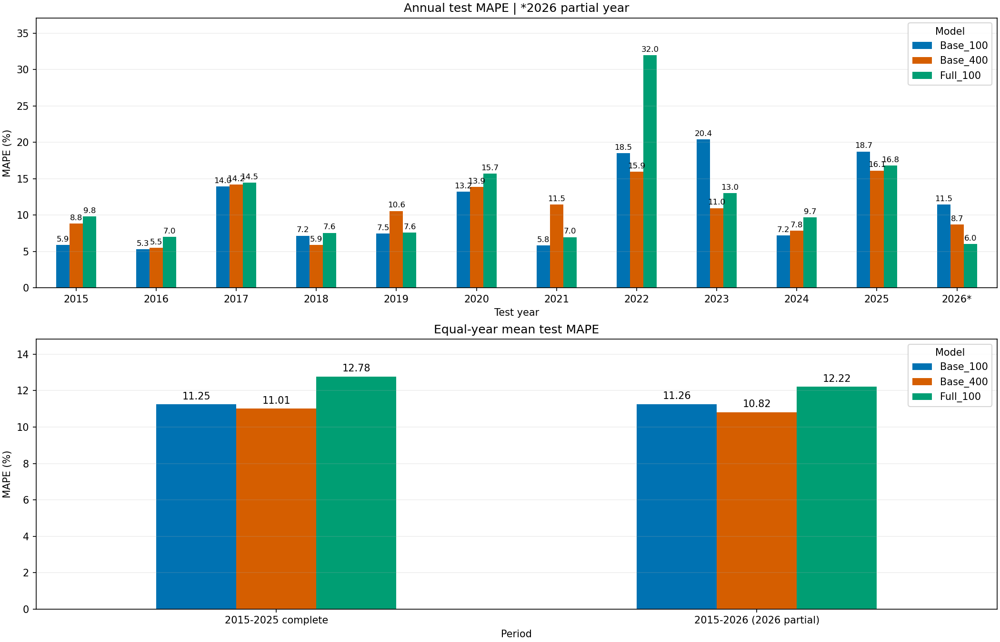

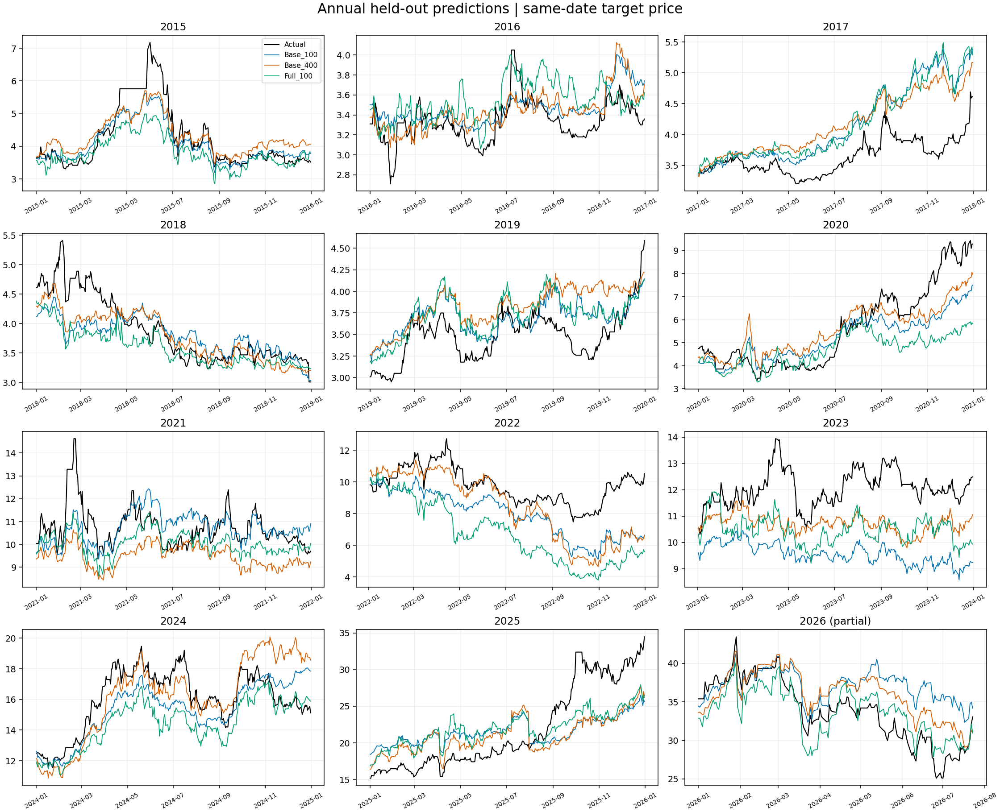

In [4]:
colors={'Base_100':'#0072B2','Base_400':'#D55E00','Full_100':'#009E73'}
fig,axes=plt.subplots(2,1,figsize=(14,9),constrained_layout=True)
a=annual[order].copy();a.index=[str(v)+('*' if v==2026 else '') for v in a.index]
a.plot.bar(ax=axes[0],color=list(colors.values()),rot=0)
axes[0].set(title='Annual test MAPE | *2026 partial year',ylabel='MAPE (%)',xlabel='Test year')
for c in axes[0].containers:axes[0].bar_label(c,fmt='%.1f',padding=2,fontsize=8)
b=summary.pivot(index='Period',columns='Model',values='Mean_annual_MAPE')[order]
b.plot.bar(ax=axes[1],color=list(colors.values()),rot=0)
axes[1].set(title='Equal-year mean test MAPE',ylabel='MAPE (%)',xlabel='Period')
for c in axes[1].containers:axes[1].bar_label(c,fmt='%.2f',padding=3)
for ax in axes:ax.grid(axis='y',alpha=.2);ax.margins(y=.16)
fig.savefig(OUT/'annual_mape_comparison.png',dpi=150);plt.close(fig);display(Image(filename=str(OUT/'annual_mape_comparison.png')))
fig,axes=plt.subplots(4,3,figsize=(16,13),constrained_layout=True)
for ax,year in zip(axes.flat,YEARS):
    test=predictions[(predictions.Year==year)&(predictions.Split=='Test')]
    actual=test[test.Model=='Base_100'];ax.plot(actual.Date,actual.Actual,color='black',lw=1.1,label='Actual')
    for name in order:
        g=test[test.Model==name];ax.plot(g.Date,g.Predicted,color=colors[name],lw=.9,label=name)
    ax.set_title(str(year)+(' (partial)' if year==2026 else ''));ax.grid(alpha=.2)
    ax.tick_params(axis='x',labelrotation=30,labelsize=7)
axes.flat[0].legend(fontsize=8)
fig.suptitle('Annual held-out predictions | same-date target price',fontsize=16)
fig.savefig(OUT/'annual_predictions.png',dpi=140);plt.close(fig);display(Image(filename=str(OUT/'annual_predictions.png')))
plot=metrics[metrics.Split=='Test'].copy();plot['Year']=plot.Year.astype(str)
fig=px.bar(plot,x='Year',y='MAPE',color='Model',barmode='group',color_discrete_map=colors,category_orders={'Model':order},title='Annual test MAPE | 2026 partial',height=550)
fig.write_html(OUT/'annual_mape_comparison.html',include_plotlyjs=True);display(fig)


## 跨年比较结论

|配置|2015—2026年度平均MAPE|2015—2025完整年度平均MAPE|跨年标准差（12年）|最差年度MAPE|年度第一次数|
|---|---:|---:|---:|---:|---:|
|基准100轮|11.2645%|11.2469%|5.5924个百分点|20.3908%（2023）|7/12|
|基准400轮|10.8198%|11.0143%|3.6402个百分点|16.1238%（2025）|4/12|
|含金铜涨幅100轮|12.2155%|12.7785%|7.2410个百分点|31.9622%（2022）|1/12|

2026只有截至7月23日的152条记录；不应将其当作全年表现。剔除2026后平均排名仍是基准400、基准100、含涨幅100。

- 基准400轮的平均、跨年标准差和最差年份误差均较好，支持它在本次固定种子的跨年回测中更能控制大误差。但比基准100轮的12年均值仅好0.4447个百分点，完整11年仅好0.2326个百分点，不能说优势很大。
- 基准100轮在7/12年胜过另外两组；延长至400轮只在5/12年比100轮更好。平均更低并不等于大多数年份更好。2023年400轮改善9.4364个百分点，对整体均值贡献较大。
- 同为100轮，基准在9/12年胜过含涨幅模型；含涨幅在2023、2025、2026优于基准100轮。2022年含涨幅模型的MAPE达到31.9622%，明显拉高其均值。
- 这些结果支持“删除涨幅在多数历史年份更好”的描述，但不能证明涨幅必然无用、400轮普遍最佳，也没有比较含涨幅模型的400轮，因此本节不能直接验证含涨幅模型延长训练后的表现。
- 2020三组结果与上一节一致，2015—2026含涨幅100轮全部复现08的已有结果。每年标准化和训练只使用测试年前的数据。

下面补充逐次去掉一个年度后的均值，检查平均排名是否过度依赖单个年份；不据此挑选测试年份或删去不利结果。


In [5]:
leave_one_out=[]
for omitted in YEARS:
    means=annual.loc[annual.index!=omitted,order].mean()
    leave_one_out.append({'Omitted_year':omitted,**means.to_dict(),'Winner':means.idxmin()})
leave_one_out=pd.DataFrame(leave_one_out)
leave_one_out.to_csv(OUT/'leave_one_year_out.csv',index=False)
display(leave_one_out.round(4))


Omitted_year,Base_100,Base_400,Full_100,Winner
2015,11.7502,11.0026,12.4355,Base_400
2016,11.8082,11.3034,12.6896,Base_400
2017,11.0199,10.5120,12.0112,Base_400
2018,11.6366,11.2689,12.6383,Base_400
2019,11.6089,10.8430,12.6333,Base_400
2020,11.0875,10.5424,11.9018,Base_400
2021,11.7585,10.7614,12.6926,Base_400
2022,10.6049,10.3545,10.4204,Base_400
2023,10.4348,10.8076,12.1413,Base_100
2024,11.6319,11.0901,12.4458,Base_400


逐次去掉单一年份后，基准400轮仍在11/12种情况下平均最优；唯一例外是去掉2023年，此时基准100轮平均最优。这说明400轮的均值优势并非对所有年度子集都稳定。

此外，去掉2022年后，含涨幅100轮的均值会略优于基准100轮（10.4204% vs 10.6049%），但仍不如基准400轮（10.3545%）。因此同时看年度胜率、最差年和均值比只看一个平均数更合适。所有年度仍保留在正式结果中。

# 五个随机种子：2015—2026逐年平均比较

固定种子 **42、7、123、2024、2025**，在原三个种子上增加两个，不根据测试表现挑选种子。继续比较Base_100、Base_400、Full_100；每个测试年使用此前全部共同样本训练，每年、每种子重新初始化。Base的100/400轮来自同一条训练路径。

其余设置沿用前节：ReLU、16/32隐藏层、Adam 0.01、全批量；标准化仅拟合对应训练集；统一去掉前20条记录，目标仍是原始同日股价。

**先对每个模型、每年5次独立训练的MAPE取平均，再对年份等权平均。不是先平均预测价格，也不是集成模型的误差。**同时保留每个种子的结果、种子标准差、成对差异和年度胜率。2026截至7月23日，单列2015—2025完整年度平均。五种子用于衡量初始化敏感性，不是五份独立市场数据，误差棒不是置信区间。本次仅新增静态图，不使用PX。


In [1]:
from pathlib import Path
import os, json, hashlib
import numpy as np
import pandas as pd
import torch
from torch import nn
from sklearn.preprocessing import StandardScaler
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
from IPython.display import display, Image
ROOT=next((p for p in [Path.cwd(),*Path.cwd().parents] if (p/'src/pickle/Dataset.pkl').exists()),Path('/Users/admin/数据分析/ZiJin-Mining/ZiJin-Mining-stock-prediction-'))
OUT=Path(os.environ.get('MLP10_FIVE_OUT',str(ROOT/'results/mlp_five_seeds_10')))
OUT.mkdir(parents=True,exist_ok=True)
SEED=42; LR=0.01
torch.set_num_threads(1)
dataset=ROOT/'src/pickle/Dataset.pkl'
d=pd.read_pickle(dataset); raw=d['X'].copy(); target=d['Y'].copy()
assert raw.index.equals(target.index) and raw.shape[1]==7
assert raw.index.is_unique and raw.index.is_monotonic_increasing
BASE=list(raw.columns); x=raw.copy()
for metal,col in [('gold','Gold Futures Price'),('copper','Copper Futures Price')]:
    for k in [5,20]: x[f'{metal}_{k}']=raw[col]/raw[col].shift(k)-1
x=x.dropna(); FULL=list(x.columns)
y=pd.Series(np.asarray(target).reshape(-1),index=raw.index,name='Actual').loc[x.index]
YEARS=list(range(2015,2027))
SEEDS=[42,7,123,2024,2025]
assert np.isfinite(x.to_numpy()).all() and np.isfinite(y).all() and (y>0).all()
config={'years':YEARS,'models':{'Base':[100,400],'Full':[100]},'base_features':BASE,'full_features':FULL,'seeds':SEEDS,'lr':LR,'hidden':[16,32],'activation':'ReLU','batch':'full','target':'original same-date price','split':'expanding training, fixed model within test year','dataset_sha256':hashlib.sha256(dataset.read_bytes()).hexdigest(),'torch_version':str(torch.__version__)}
(OUT/'config.json').write_text(json.dumps(config,ensure_ascii=False,indent=2))
order=['Base_100','Base_400','Full_100']


In [2]:
metric_rows=[]; frames=[]; histories=[]; split_rows=[]
for year in YEARS:
    tr=x.index[x.index.year<year]; te=x.index[x.index.year==year]
    assert len(tr)>0 and len(te)>0 and tr.max()<te.min()
    for split,idx in [('Train',tr),('Test',te)]:
        split_rows.append({'Year':year,'Split':split,'N':len(idx),'Start':str(idx.min().date()),'End':str(idx.max().date())})
    for seed in SEEDS:
        sy=StandardScaler().fit(y.loc[tr].to_numpy().reshape(-1,1))
        yt=torch.tensor(sy.transform(y.loc[tr].to_numpy().reshape(-1,1)),dtype=torch.float32)
        for family,cols,checkpoints in [('Base',BASE,[100,400]),('Full',FULL,[100])]:
            sx=StandardScaler().fit(x.loc[tr,cols])
            xt=torch.tensor(sx.transform(x.loc[tr,cols]),dtype=torch.float32)
            torch.manual_seed(seed)
            model=nn.Sequential(nn.Linear(len(cols),16),nn.ReLU(),nn.Linear(16,32),nn.ReLU(),nn.Linear(32,1))
            optimizer=torch.optim.Adam(model.parameters(),lr=LR)
            for epoch in range(1,max(checkpoints)+1):
                model.train();optimizer.zero_grad()
                loss=((model(xt)-yt)**2).mean();assert torch.isfinite(loss)
                loss.backward();optimizer.step();model.eval()
                with torch.no_grad(): mse=((model(xt)-yt)**2).mean().item()
                histories.append({'Year':year,'Seed':seed,'Family':family,'Epoch':epoch,'Train_MSE_standardized':mse})
                if epoch not in checkpoints:continue
                name=f'{family}_{epoch}'
                torch.save({'state_dict':model.state_dict(),'features':cols,'epoch':epoch,'seed':seed,
                            'train_start':str(tr.min()),'train_end':str(tr.max()),
                            'sx_mean':sx.mean_.tolist(),'sx_scale':sx.scale_.tolist(),
                            'sy_mean':sy.mean_.tolist(),'sy_scale':sy.scale_.tolist()},OUT/f'{year}_{name}_seed{seed}.pt')
                for split,idx in [('Train',tr),('Test',te)]:
                    with torch.no_grad(): z=model(torch.tensor(sx.transform(x.loc[idx,cols]),dtype=torch.float32)).numpy()
                    pred=sy.inverse_transform(z).ravel();actual=y.loc[idx].to_numpy();err=pred-actual
                    assert np.isfinite(pred).all()
                    frames.append(pd.DataFrame({'Year':year,'Seed':seed,'Date':idx,'Model':name,'Split':split,'Actual':actual,'Predicted':pred,'APE':100*np.abs(err)/actual,'PE':100*err/actual}))
                    metric_rows.append({'Year':year,'Seed':seed,'Model':name,'Split':split,'N':len(idx),'MAPE':100*np.mean(np.abs(err)/actual),'MAE':np.abs(err).mean(),'RMSE':np.sqrt(np.mean(err**2)),'MPE':100*np.mean(err/actual)})
    print(f'{year} complete: train={len(tr)}, test={len(te)}, test end={te.max().date()}',flush=True)
metrics=pd.DataFrame(metric_rows);predictions=pd.concat(frames,ignore_index=True);history=pd.DataFrame(histories);splits=pd.DataFrame(split_rows)
for name,frame in [('metrics',metrics),('predictions',predictions),('training_history',history),('splits',splits)]:frame.to_csv(OUT/f'{name}.csv',index=False)

assert len(metrics)==12*5*3*2
assert len(list(OUT.glob('*.pt')))==180
prior=pd.read_csv(ROOT/'results/mlp_annual_three_models_10/metrics.csv')
current=metrics[metrics.Seed==42]
check=prior.merge(current,on=['Year','Model','Split'],suffixes=('_old','_new'),validate='one_to_one')
assert len(check)==72 and np.allclose(check.MAPE_old,check.MAPE_new,atol=1e-6)
print('seed42全部年份三组模型均复现上一节结果。')
# Compare with the saved 06 three-seed experiment, if available.
prior06=ROOT/'results/mlp_basis_06/metrics.csv'
if not prior06.exists():prior06=Path('outputs/mlp_basis_06/metrics.csv')
if prior06.exists():
    old=pd.read_csv(prior06);old=old[old.Model.isin(['A_base','C_returns'])].copy()
    old['Model']=old.Model.map({'A_base':'Base_100','C_returns':'Full_100'})
    check=old.merge(metrics,on=['Year','Seed','Model','Split'],suffixes=('_old','_new'),validate='one_to_one')
    assert len(check)==72 and np.allclose(check.MAPE_old,check.MAPE_new,atol=1e-6)
    print('06中2021—2026的三个种子A/C结果全部复现。')


2015 complete: train=693, test=266, test end=2015-12-31
2016 complete: train=959, test=268, test end=2016-12-31
2017 complete: train=1227, test=267, test end=2017-12-31
2018 complete: train=1494, test=269, test end=2018-12-31
2019 complete: train=1763, test=271, test end=2019-12-31
2020 complete: train=2034, test=271, test end=2020-12-31
2021 complete: train=2305, test=272, test end=2021-12-31
2022 complete: train=2577, test=274, test end=2022-12-31
2023 complete: train=2851, test=273, test end=2023-12-31
2024 complete: train=3124, test=273, test end=2024-12-31
2025 complete: train=3397, test=268, test end=2025-12-31
2026 complete: train=3665, test=152, test end=2026-07-23
seed42全部年份三组模型均复现上一节结果。
06中2021—2026的三个种子A/C结果全部复现。


In [3]:
test=metrics[metrics.Split=='Test'].copy()
annual=test.groupby(['Year','Model']).MAPE.mean().unstack()[order]
seed_std=test.groupby(['Year','Model']).MAPE.std().unstack()[order]
annual.to_csv(OUT/'annual_mean_mape.csv');seed_std.to_csv(OUT/'annual_seed_std.csv')
seed_means=[]; summary=[]
for period,years in [('2015-2026 (2026 partial)',YEARS),('2015-2025 complete',list(range(2015,2026)))]:
    a=annual.loc[years]
    for model in order:
        t=test[test.Year.isin(years)&(test.Model==model)]
        summary.append({'Period':period,'Model':model,'Mean_MAPE':a[model].mean(),'Median_annual_MAPE':a[model].median(),'Across_year_std':a[model].std(),'Mean_within_year_seed_std':seed_std.loc[years,model].mean(),'Worst_annual_mean_MAPE':a[model].max(),'Worst_year':int(a[model].idxmax()),'Winning_years':int((a.idxmin(axis=1)==model).sum())})
        for seed,g in t.groupby('Seed'):
            seed_means.append({'Period':period,'Model':model,'Seed':seed,'Mean_annual_MAPE':g.MAPE.mean()})
summary=pd.DataFrame(summary);seed_means=pd.DataFrame(seed_means)
summary.to_csv(OUT/'summary.csv',index=False);seed_means.to_csv(OUT/'per_seed_means.csv',index=False)
pair=test.pivot(index=['Year','Seed'],columns='Model',values='MAPE')
contrasts=pd.DataFrame({'Full100_minus_Base100_pp':pair.Full_100-pair.Base_100,'Base400_minus_Base100_pp':pair.Base_400-pair.Base_100,'Full100_minus_Base400_pp':pair.Full_100-pair.Base_400})
contrasts.to_csv(OUT/'paired_differences.csv')
paired_annual=contrasts.groupby('Year').agg(['mean','std']);paired_annual.to_csv(OUT/'annual_paired_differences.csv')
print('每年五个种子的平均MAPE（%）：');display(annual.round(4))
print('每年种子间标准差（百分点）：');display(seed_std.round(4))
print('汇总：');display(summary.round(4))
print('每个种子的年度平均：');display(seed_means.pivot(index=['Period','Seed'],columns='Model',values='Mean_annual_MAPE')[order].round(4))
print('成对差异，负值为前者更好：');display(paired_annual.round(4))


Model,Base_100,Base_400,Full_100
Year,,,
2015,8.7523,8.6711,10.5896
2016,8.4562,8.7856,6.0846
2017,14.3565,14.8649,12.2430
2018,7.1958,7.1235,7.4573
2019,10.9390,12.5668,8.1409
2020,13.8660,13.6915,16.6472
2021,8.9262,14.9920,6.1622
2022,35.0674,34.9818,30.9360
2023,13.2728,10.6114,13.8471


Model,Base_100,Base_400,Full_100
Year,,,
2015,3.5856,2.4802,2.0554
2016,4.3453,5.7082,1.0729
2017,0.8136,1.8713,2.2227
2018,1.7485,1.7690,1.1733
2019,4.1404,2.6985,2.1963
2020,2.3764,1.4301,2.3443
2021,5.4845,3.3839,0.5279
2022,9.6959,11.7696,6.0258
2023,4.5556,1.3521,2.2519


,Period,Model,Mean_MAPE,Median_annual_MAPE,Across_year_std,Mean_within_year_seed_std,Worst_annual_mean_MAPE,Worst_year,Winning_years
0,2015-2026 (2026 partial),Base_100,12.9448,10.3301,7.5956,3.3870,35.0674,2022,2
1,2015-2026 (2026 partial),Base_400,13.4192,11.5891,7.4870,3.0612,34.9818,2022,4
2,2015-2026 (2026 partial),Full_100,12.1317,9.6332,7.1125,1.9137,30.9360,2022,6
3,2015-2025 complete,Base_100,13.2379,10.9390,7.8948,3.5297,35.0674,2022,2
4,2015-2025 complete,Base_400,13.7694,12.5668,7.7486,3.1299,34.9818,2022,4
5,2015-2025 complete,Full_100,12.5846,10.5896,7.2759,2.0029,30.9360,2022,5


Model                          Base_100  Base_400  Full_100
Period                   Seed                              
2015-2025 complete       7      13.5380   15.2941   13.5657
                         42     11.2469   11.0143   12.7785
                         123    13.6309   13.6375   10.9713
                         2024   13.5595   14.8587   13.4545
                         2025   14.2140   14.0425   12.1527
2015-2026 (2026 partial) 7      13.0592   14.8416   13.1441
                         42     11.2645   10.8198   12.2155
                         123    13.1945   13.6208   10.6865
                         2024   13.1920   14.2883   12.9008
                         2025   14.0140   13.5255   11.7115

Full100_minus_Base100_pp           ... Full100_minus_Base400_pp         
                         mean      std  ...                     mean      std
Year                                    ...                                  
2015                   1.8373   4.4427  ...                   1.9185   2.9281
2016                  -2.3716   4.5205  ...                  -2.7010   6.1523
2017                  -2.1135   2.0247  ...                  -2.6219   3.5314
2018                   0.2615   2.3825  ...                   0.3338   2.1381
2019                  -2.7981   5.6801  ...                  -4.4259   4.6837
2020                   2.7812   4.0426  ...                   2.9557   3.0206
2021                  -2.7640   5.8212  ...                  -8.8298   3.6080
2022                  -4.1313  10.7047  ...                  -4.0458  11.6514
2023                   0.5744   5.6808  ...                   3.2358   2.3260
2024                   0.7739   1.5704  ...                   0.4784   1.8895
2025                   0.7637   2.0574  ...                   0.6688   1.4162
2026                  -2.5712   2.6334  ...                  -2.4169   2.0455

[12 rows x 6 columns]

每年五个种子的平均MAPE（%）：
每年种子间标准差（百分点）：
汇总：
每个种子的年度平均：
成对差异，负值为前者更好：


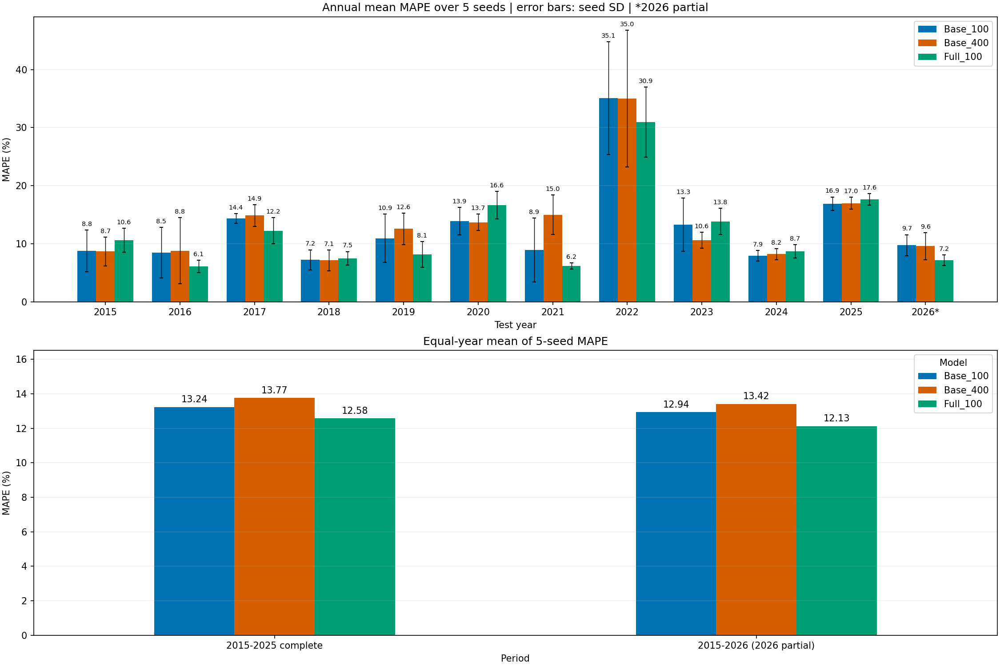

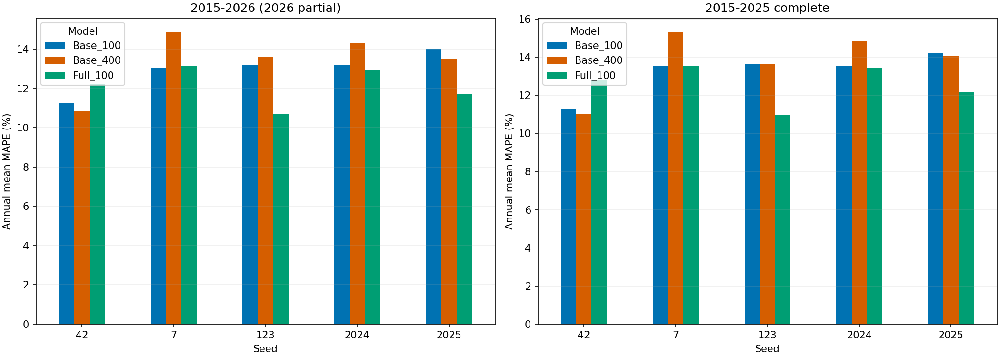

In [4]:
colors={'Base_100':'#0072B2','Base_400':'#D55E00','Full_100':'#009E73'}
fig,axes=plt.subplots(2,1,figsize=(15,10),constrained_layout=True)
pos=np.arange(len(YEARS));width=.25
for j,model in enumerate(order):
    bars=axes[0].bar(pos+(j-1)*width,annual[model],width,label=model,color=colors[model],yerr=seed_std[model],capsize=2,error_kw={'elinewidth':.7})
    axes[0].bar_label(bars,fmt='%.1f',padding=3,fontsize=7)
axes[0].set_xticks(pos,[str(v)+('*' if v==2026 else '') for v in YEARS])
axes[0].set(title='Annual mean MAPE over 5 seeds | error bars: seed SD | *2026 partial',ylabel='MAPE (%)',xlabel='Test year')
axes[0].legend();axes[0].grid(axis='y',alpha=.2)
b=summary.pivot(index='Period',columns='Model',values='Mean_MAPE')[order]
b.plot.bar(ax=axes[1],color=list(colors.values()),rot=0)
for c in axes[1].containers:axes[1].bar_label(c,fmt='%.2f',padding=3)
axes[1].set(title='Equal-year mean of 5-seed MAPE',ylabel='MAPE (%)',xlabel='Period');axes[1].margins(y=.2);axes[1].grid(axis='y',alpha=.2)
fig.savefig(OUT/'five_seed_comparison.png',dpi=150);plt.close(fig);display(Image(filename=str(OUT/'five_seed_comparison.png')))
fig,axes=plt.subplots(1,2,figsize=(14,5),constrained_layout=True)
for ax,period in zip(axes,['2015-2026 (2026 partial)','2015-2025 complete']):
    z=seed_means[seed_means.Period==period].pivot(index='Seed',columns='Model',values='Mean_annual_MAPE').loc[SEEDS,order]
    z.plot.bar(ax=ax,color=list(colors.values()),rot=0)
    ax.set(title=period,xlabel='Seed',ylabel='Annual mean MAPE (%)');ax.grid(axis='y',alpha=.2)
fig.savefig(OUT/'per_seed_means.png',dpi=150);plt.close(fig);display(Image(filename=str(OUT/'per_seed_means.png')))


## 五种子结果与结论修正

|模型|2015—2026平均MAPE|2015—2025完整年度平均MAPE|年度第一次数|平均年内种子标准差|
|---|---:|---:|---:|---:|
|基准100轮|12.9448%|13.2379%|2/12|3.3870个百分点|
|基准400轮|13.4192%|13.7694%|4/12|3.0612个百分点|
|含金铜涨幅100轮|12.1317%|12.5846%|6/12|1.9137个百分点|

平均采用每年五种子的MAPE均值，再年度等权平均。2026截至7月23日。含涨幅100轮的12年均值比基准100轮低0.8131个百分点，比基准400轮低1.2875个百分点；只看完整11年，排名不变。

**单种子下基准400轮平均最优的结论，没有在五种子平均中保持。**seed42在这五个种子中恰好使两种基准模型的跨年平均误差都最低。含涨幅100轮的种子间波动更小：以每年种子标准差再年度平均衡量，为1.91个百分点，低于两种基准。

含涨幅100轮的年度均值在2016、2017、2019、2021、2022、2026排名第一；基准400轮在2015、2018、2020、2023第一；基准100轮在2024、2025第一。因此涨幅仍非每年都有帮助，2020去掉涨幅更好的发现仍然成立。

所有模型在2022年都有较大误差，五种子均值约31%—35%，说明更换种子或加入涨幅并未消除该年度的困难。400轮相比基准100轮的整体均值反而增加0.4744个百分点，尤其2021年退步明显。

本轮支持“在这些年份和五个固定种子的平均结果中，含涨幅100轮总体更好且初始化波动更小”，不证明未来稳定占优或统计显著。没有把五次预测平均成集成预测。

核验：seed42的12年三组结果全部复现上一节；06中2021—2026、三个旧种子的A/C结果全部复现。已保存180份年度/种子模型权重、预测、训练历史、误差及静态图。旧内容保留，本节结论优先用于描述五种子实验。


---

直接的结论只用了1个种子,现在用了5个种子,发现仍然是保留涨幅的平均解释力更好一点.  

但是从上面的折线图来看,目前的模型的预测准确率仍然很差.可能在某些趋势中走势一致,但是始终会有一个明显的差值.

针对20年的历史数据,我们发现在7,9,11月有成交量的放大.我们是否没有纳入成交量的相对变化,导致无法解释?

---